In [1]:

import pandas as pd
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
from keras.layers import SimpleRNN, Dense, Dropout, LSTM
from keras.models import Sequential
from keras.models import model_from_json

/anaconda2/envs/pyy36/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
# func to save and load file to reduce processing time
import pickle
def save(dictionary, name):
    with open(name, 'wb') as fp:
        pickle.dump(dictionary, fp, protocol=pickle.HIGHEST_PROTOCOL)

# func to load:
def load(name):
    with open(name, 'rb') as fp:
        data = pickle.load(fp)
        return data

In [3]:
dictionary = load("/Users/sakshamgarg/Desktop/Agriculture/dict_temperatureFinal.dms")

In [4]:
dictionary

{'adilabad': {1912: array([22.965, 24.17, 28.024, 31.609, 33.0, 31.1, 27.18,
         25.999000000000002, 27.660999999999998, 26.686, 23.166999999999998,
         21.096], dtype=object),
  1913: array([23.233, 24.964000000000002, 29.675, 32.378, 35.101, 32.33,
         28.375999999999998, 27.853, 26.851999999999997, 26.614, 22.351,
         21.26], dtype=object),
  1914: array([22.708000000000002, 24.058000000000003, 28.554000000000002, 32.16,
         32.434, 32.286, 27.008000000000003, 26.479, 26.761999999999997,
         25.25, 21.656999999999996, 20.215999999999998], dtype=object),
  1915: array([22.413, 24.189, 28.269000000000002, 32.898, 33.69, 29.975, 27.588,
         27.1, 26.565, 26.116999999999997, 22.051, 20.894000000000002],
        dtype=object),
  1916: array([21.963, 22.996, 28.156, 30.432, 34.193000000000005, 32.5, 27.96,
         26.899, 26.491, 26.089000000000002, 23.558000000000003, 20.526],
        dtype=object),
  1917: array([22.599, 24.932, 27.901, 32.973, 35.192

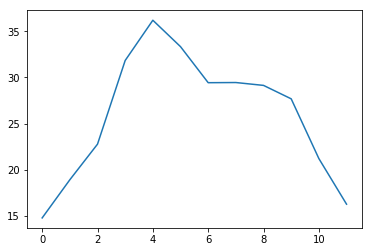

In [5]:
plt.plot(dictionary['aligarh'][1991])

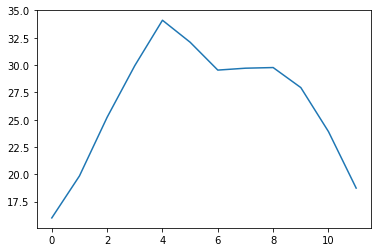

In [6]:
plt.plot(dictionary['jaunpur'][2012])

In [7]:
dict_name = dictionary.keys()

In [8]:
dictionary['adilabad'].keys()

dict_keys([1912, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013])

In [9]:
def CreateDataset(district):
    lst=[]
    for year in dictionary[district]:
        lst.append(dictionary[district][year])
    lst = np.array(lst)
    # print(lst.shape)
    trainData = lst[:90]
    testData = lst[90:]
    x_train, y_train = CreateTrainDataset(trainData)
    x_test, y_test = CreateTrainDataset(testData)
    return x_train, x_test, y_train, y_test

In [10]:
def CreateTrainDataset(data, k=10):
    dataX, dataY = [],[]
    for i in range(data.shape[0]-k):
        x = data[i:i+k]
        dataX.append(x)
        y = data[i+k]
        dataY.append(y)
    return np.array(dataX), np.array(dataY)

In [11]:
# def CreateTestX(data, k=10):
#     testx = []
#     for i in range(data.shape[0] - k + 1):
#         x = data[i:i+k]
#         testx.append(x)
#     return np.array(testx)

# def CreateTestY(data, k=10):
#     testy = []
#     for i in range(data.shape[0] - k):
#         y = data[i+k]
#         testy.append(y)
#     return np.array(testy)

In [12]:
dictionary['ghaziabad']

{1912: array([15.009, 18.590999999999998, 23.895, 29.945999999999998,
        33.224000000000004, 35.284, 30.794, 29.21, 28.410999999999998,
        27.225, 21.305, 16.772000000000002], dtype=object),
 1913: array([17.461, 19.346, 26.737, 30.214000000000002, 34.346, 35.093, 30.25,
        29.706999999999997, 28.845, 26.212, 20.717, 15.863], dtype=object),
 1914: array([16.699, 18.275, 24.314, 30.613000000000003, 33.853, 34.298,
        31.468000000000004, 29.463, 29.625, 26.653000000000002, 20.335,
        15.89], dtype=object),
 1915: array([16.698, 18.893, 24.861, 31.53, 32.881, 32.326, 29.113000000000003,
        28.673000000000002, 28.776, 26.443, 20.223, 17.143], dtype=object),
 1916: array([15.299000000000001, 15.029000000000002, 22.684, 27.566, 33.325,
        36.296, 29.985, 28.744, 28.776, 26.272, 21.206999999999997, 16.529],
       dtype=object),
 1917: array([16.043, 18.445, 23.336, 30.581, 35.062, 33.805, 30.279,
        28.993000000000002, 29.275, 26.58, 21.755, 17.264], d

In [13]:
districtname = 'lucknow'
x_train, x_test, y_train, y_test = CreateDataset(districtname)

In [14]:
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((80, 10, 12), (80, 12), (2, 10, 12), (2, 12))

In [15]:
x_test[0][0]

array([15.543, 19.794, 24.49, 29.886999999999997, 35.146,
       33.989000000000004, 32.413000000000004, 28.858, 29.364, 25.915,
       20.266, 16.730999999999998], dtype=object)

In [16]:
model = Sequential()
look=10

In [17]:
x_train.shape, y_train.shape

((80, 10, 12), (80, 12))

In [18]:
model.add(LSTM(350,input_shape=(10, 12),))
model.add(Dense(12))
model.compile(loss='mean_squared_error',optimizer='RMSprop')
model.fit(x_train , y_train, epochs=40, batch_size=5)

Epoch 1/40
80/80 [==============================] - 1s 15ms/step - loss: 527.0338
Epoch 2/40
80/80 [==============================] - 1s 7ms/step - loss: 382.3757
Epoch 3/40
80/80 [==============================] - 1s 7ms/step - loss: 296.5028
Epoch 4/40
80/80 [==============================] - 1s 7ms/step - loss: 224.2615
Epoch 5/40
80/80 [==============================] - 1s 7ms/step - loss: 163.9963
Epoch 6/40
80/80 [==============================] - 1s 8ms/step - loss: 115.1928
Epoch 7/40
80/80 [==============================] - 1s 9ms/step - loss: 76.9199
Epoch 8/40
80/80 [==============================] - 1s 9ms/step - loss: 48.0123
Epoch 9/40
80/80 [==============================] - 1s 9ms/step - loss: 27.3208
Epoch 10/40
80/80 [==============================] - 1s 8ms/step - loss: 13.6865
Epoch 11/40
80/80 [==============================] - 1s 7ms/step - loss: 5.6597
Epoch 12/40
80/80 [==============================] - 1s 10ms/step - loss: 2.1145
Epoch 13/40
80/80 [============

In [19]:
ypred=model.predict(x_test)

In [20]:
ypred, y_test

(array([[15.897118, 18.139662, 24.124296, 30.15541 , 33.928677, 33.69964 ,
         30.53272 , 29.48198 , 29.244158, 26.755161, 20.909077, 16.32931 ],
        [15.897111, 18.139666, 24.124311, 30.155426, 33.928707, 33.69966 ,
         30.532728, 29.482006, 29.24417 , 26.75517 , 20.909105, 16.329306]],
       dtype=float32),
 array([[15.424000000000001, 19.075, 24.54, 29.199, 33.425, 32.218,
         30.268, 30.256999999999998, 30.11, 27.728, 22.808000000000003,
         17.373],
        [16.602, 17.355, 25.451, 30.971999999999998, 35.464, 34.227,
         33.121, 29.814, 28.574, 27.041999999999998, 21.729, 16.777]],
       dtype=object))

In [21]:
from sklearn.metrics import mean_absolute_error

In [22]:
mean_absolute_error(ypred[0],y_test[0])

0.8822434450785317

In [23]:
model.compile(loss='mean_squared_error',optimizer='rmsprop', metrics=['accuracy'])

In [24]:
# # loading model and weights:
# json_file = open('sitapurmodeltemperature.json', 'r')
# loaded_model_json = json_file.read()
# json_file.close()
# loaded_model = model_from_json(loaded_model_json)
# # loading wt:
# loaded_model.load_weights("sitapurtemperature.h5")
# print("loaded successfully")

In [25]:
# loaded_model.compile(loss='mean_squared_error',optimizer='rmsprop', metrics=['accuracy'])

Text(0,0.5,'Temperature(C)')

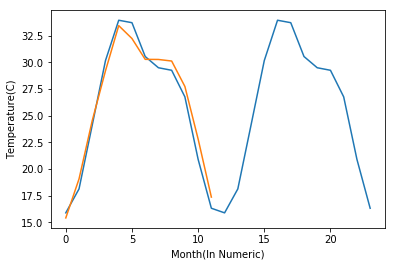

In [26]:
plt.plot(ypred.ravel())
plt.plot(y_test[:1].ravel())
plt.xlabel('Month(In Numeric)')
plt.ylabel('Temperature(C)')

Text(0,0.5,'Temperature (in C)')

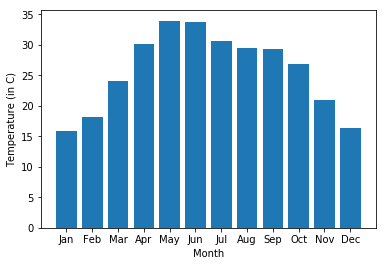

In [27]:
# plt.bar(ypred.ravel(), 12)
x=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
plt.bar(x,ypred[1])
plt.xlabel("Month")
plt.ylabel("Temperature (in C)")

In [28]:
model_RNN = Sequential()

In [29]:
model_RNN.add(SimpleRNN(350,input_shape=(10, 12),))
model_RNN.add(Dense(12))
model_RNN.compile(loss='mean_squared_error',optimizer='RMSprop', metrics=['accuracy'])
model_RNN.fit(x_train , y_train, epochs=40, batch_size=2)

Epoch 1/40
80/80 [==============================] - 1s 7ms/step - loss: 250.8145 - acc: 0.0250
Epoch 2/40
80/80 [==============================] - 0s 3ms/step - loss: 31.7157 - acc: 0.4750
Epoch 3/40
80/80 [==============================] - 0s 4ms/step - loss: 1.5063 - acc: 0.4625
Epoch 4/40
80/80 [==============================] - 0s 4ms/step - loss: 1.1245 - acc: 0.4125
Epoch 5/40
80/80 [==============================] - 0s 4ms/step - loss: 1.1116 - acc: 0.4375
Epoch 6/40
80/80 [==============================] - 0s 3ms/step - loss: 1.0987 - acc: 0.5875
Epoch 7/40
80/80 [==============================] - 0s 3ms/step - loss: 1.0745 - acc: 0.4875
Epoch 8/40
80/80 [==============================] - 0s 4ms/step - loss: 1.1328 - acc: 0.4125
Epoch 9/40
80/80 [==============================] - 0s 4ms/step - loss: 1.0985 - acc: 0.4125
Epoch 10/40
80/80 [==============================] - 0s 4ms/step - loss: 1.1389 - acc: 0.5625
Epoch 11/40
80/80 [==============================] - 0s 3ms/step -

In [30]:
ypredRnn = model_RNN.predict(x_test)

In [31]:
y_test, ypredRnn

(array([[15.424000000000001, 19.075, 24.54, 29.199, 33.425, 32.218,
         30.268, 30.256999999999998, 30.11, 27.728, 22.808000000000003,
         17.373],
        [16.602, 17.355, 25.451, 30.971999999999998, 35.464, 34.227,
         33.121, 29.814, 28.574, 27.041999999999998, 21.729, 16.777]],
       dtype=object),
 array([[16.029537, 18.745346, 23.84523 , 30.14827 , 34.22964 , 33.70322 ,
         30.879684, 29.618246, 29.25599 , 26.33378 , 20.14975 , 16.180197],
        [16.029535, 18.745346, 23.845234, 30.148272, 34.22964 , 33.70322 ,
         30.879686, 29.618246, 29.255991, 26.33378 , 20.14975 , 16.180199]],
       dtype=float32))

Text(0,0.5,'Temperature(C)')

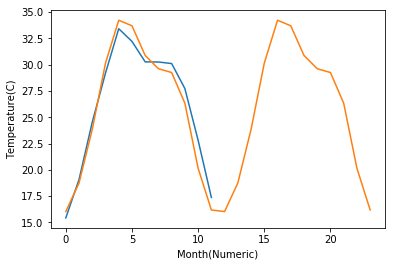

In [32]:
plt.plot(y_test[:1].ravel())
plt.plot(ypredRnn.ravel())
plt.xlabel('Month(Numeric)')
plt.ylabel('Temperature(C)')

Text(0,0.5,'Temperature (in C)')

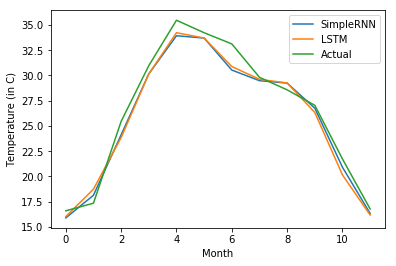

In [33]:
plt.plot(ypred[1],label="SimpleRNN")
plt.plot(ypredRnn[1],label="LSTM")
plt.plot(y_test[1],label="Actual")
plt.legend()
plt.xlabel("Month")
plt.ylabel("Temperature (in C)")

In [34]:
from sklearn.metrics import mean_absolute_error

In [35]:
mean_absolute_error(ypredRnn[0],y_test[0])

1.0182345415751137

Text(0,0.5,'Temperature (in C)')

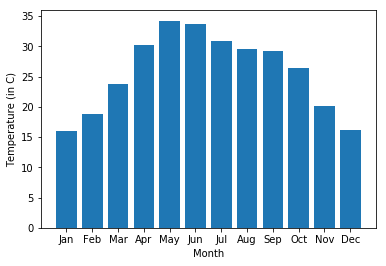

In [36]:
# plt.bar(ypred.ravel(), 12)
x=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
plt.bar(x,ypredRnn[1])
plt.xlabel("Month")
plt.ylabel("Temperature (in C)")